# Ejercicio optativo de Teledetección

**Autora: [Mariela Rajngewerc](https://github.com/marielaraj/)**

La imagen original fue bajada de la página del [earthexplorer](https://earthexplorer.usgs.gov/). En esa página se pueden bajar imágenes con distinto nivel de pre-procesamiento. Para este ejercicio bajamos una imagen de nivel de procesamiento 2, esto quiere decir que los valores de los pixeles representan la reflectancia en superficie en distintas longitudes de onda. [Acá](https://www.usgs.gov/media/files/landsat-8-collection-1-land-surface-reflectance-code-product-guide) pueden encontrar el manual de estas imagenes donde les detallan la descripción tanto de los nombres de lor archivos como de los preprocesamiento que tienen realizados. 

Para este ejercicio hemos realizado un clip de cada una de las bandas originales de la imagen y ya multiplicamos a cada una de las bandas por el factor de escala indicado en el manual (0,0001).

Las longitudes de onda y la resoluciones de cada banda de la imágen se describen a continuación:


| Banda                        | Longitud de onda (nanómetros) | Resolución espacial (metros) |
| ---------------------------- | ----------------------------- | ---------------------------- |
| Banda 1 - Aerosoles          | 430 - 450                       | 30                           |
| Banda 2 - Azul               | 450 - 510                       | 30                           |
| Banda 3 - Verde              | 530 - 590                       | 30                           |
| Banda 4 - Rojo               | 640 - 670                       | 30                           |
| Banda 5 - Infrarrojo cercano | 850 - 880                       | 30                           |
| Banda 5 - Infrarrojo medio 1 | 1570 - 1650                   | 30                           |
| Banda 7 - Infrarrojo medio 2 | 2110 - 2290                   | 30                           |

Si desean abrir los datos de la imagen original en Python deberán bajar algunas librerías específicas para la manipulación de datos satelitales, por ejemplo: **gdal**. [Acá](https://www.github.com/marielaraj/pycon_tallerimgssat) hay un tutorial de los primeros pasos.

En la carpeta [clip](https://drive.google.com/file/d/1uoigo5s2xgWfbBQdUcJfOdhfYMNjZ8Ku/view?usp=sharing) encontrarán los datos que vamos a usar en los ejercicios. Cada banda del clip se encuentra en formato .npy

# Importamos bibliotecas

Importamos las bibliotecas y abrimos algunas bandas de datos


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import axes_grid1

def add_colorbar(im, aspect=20, pad_fraction=0.5, **kwargs):
    """Add a vertical color bar to an image plot."""
    divider = axes_grid1.make_axes_locatable(im.axes)
    width = axes_grid1.axes_size.AxesY(im.axes, aspect=1./aspect)
    pad = axes_grid1.axes_size.Fraction(pad_fraction, width)
    current_ax = plt.gca()
    cax = divider.append_axes("right", size=width, pad=pad)
    plt.sca(current_ax)
    return im.axes.figure.colorbar(im, cax=cax, **kwargs)

# Levanto los datos


In [5]:
rgb.shape

NameError: name 'rgb' is not defined

In [3]:
#Levanto los datos
bNIR=np.load('clip/LC08_L1TP_225084_20180213_20180222_01_T1_sr_band5_clip.npy')
bR=np.load('clip/LC08_L1TP_225084_20180213_20180222_01_T1_sr_band4_clip.npy')
bG=np.load('clip/LC08_L1TP_225084_20180213_20180222_01_T1_sr_band3_clip.npy')
bB=np.load('clip/LC08_L1TP_225084_20180213_20180222_01_T1_sr_band2_clip.npy')

NameError: name 'np' is not defined

# Miro Banda Roja

Ploteamos con `imshow` la banda roja, asi como viene....

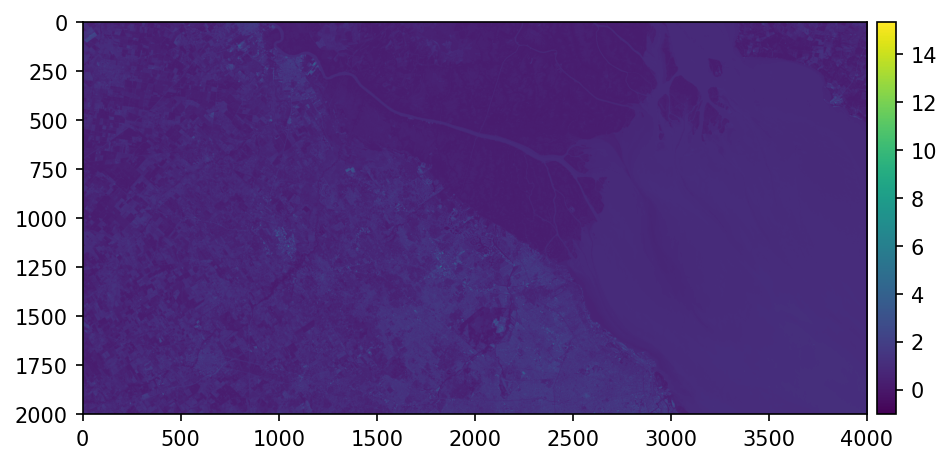

In [3]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bR)
add_colorbar(im)

Se ve bastante mal

Conviene setear el rango de valores para que se vea mejor. Para saber qué rango, miramos el histograma

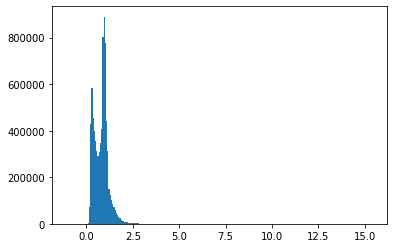

In [67]:
h=plt.hist(bR.flatten(),bins=250)

ajustemos primero el rango del histograma

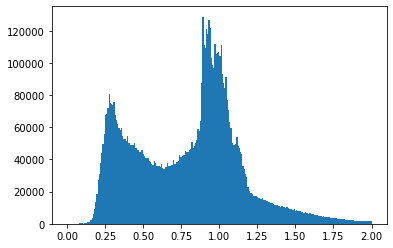

In [4]:
h=plt.hist(bR.flatten(),bins=250,range=(0,2))

Usemos entonces el rango [0, 2] para visualizar la banda roja

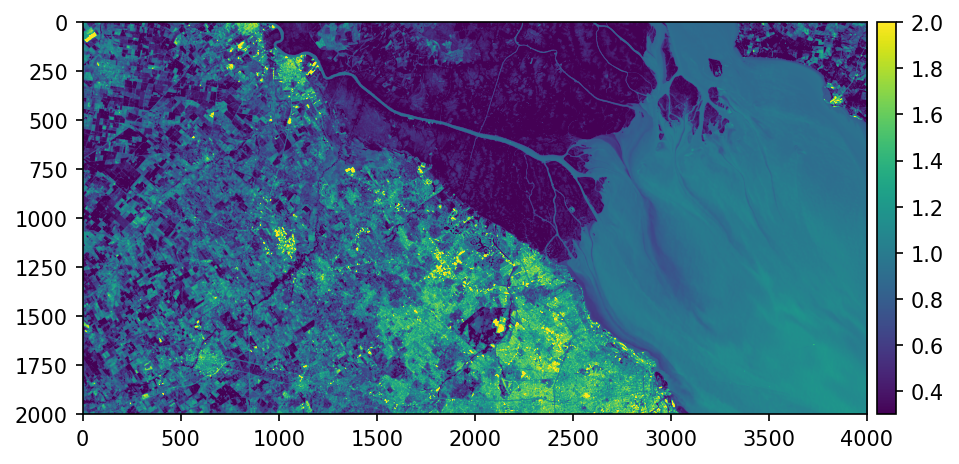

In [106]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bR,vmin=0.3, vmax=2)
add_colorbar(im)

# Miro la Banda Infraroja
Repitamos el procedimiento con NIR (near infrared)

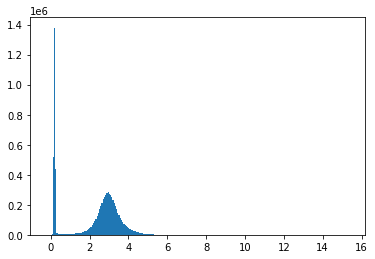

In [71]:
h=plt.hist(bNIR.flatten(),bins=250)

ajusto el rango del histograma a [0, 5]

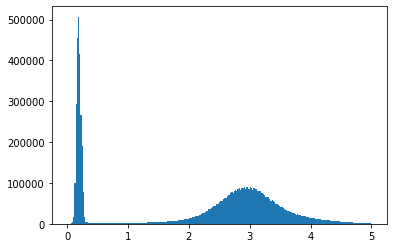

In [72]:
h=plt.hist(bNIR.flatten(),bins=250,range=(0,5))

Uso ese mismo rango apra visualizar la imágen.

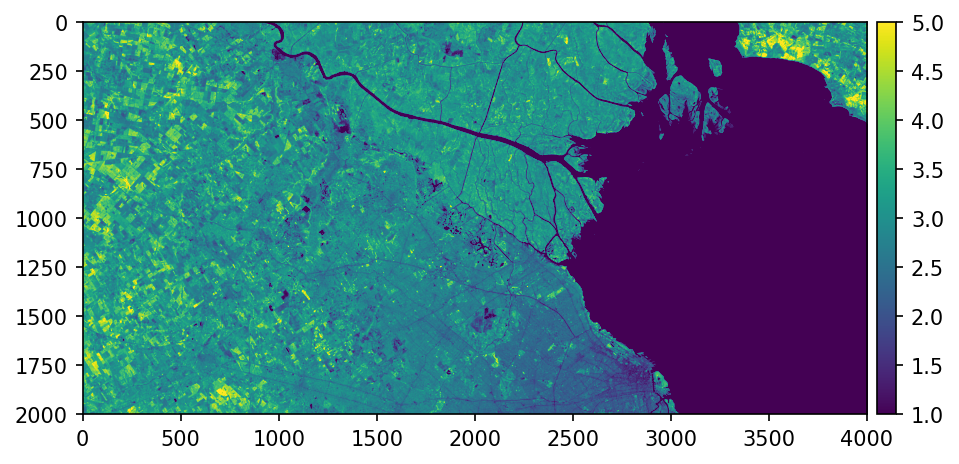

In [88]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bNIR,vmin=1, vmax=5)
add_colorbar(im)

Veamos las dos bandas, una bajo la otra


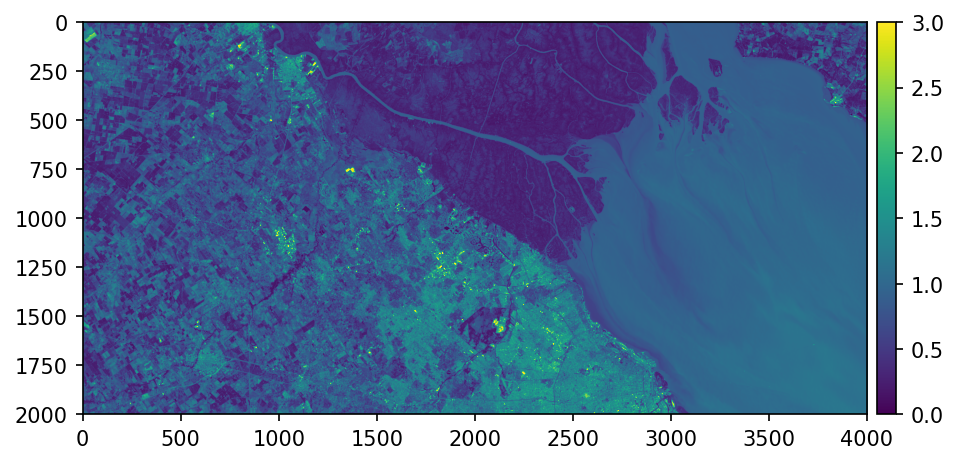

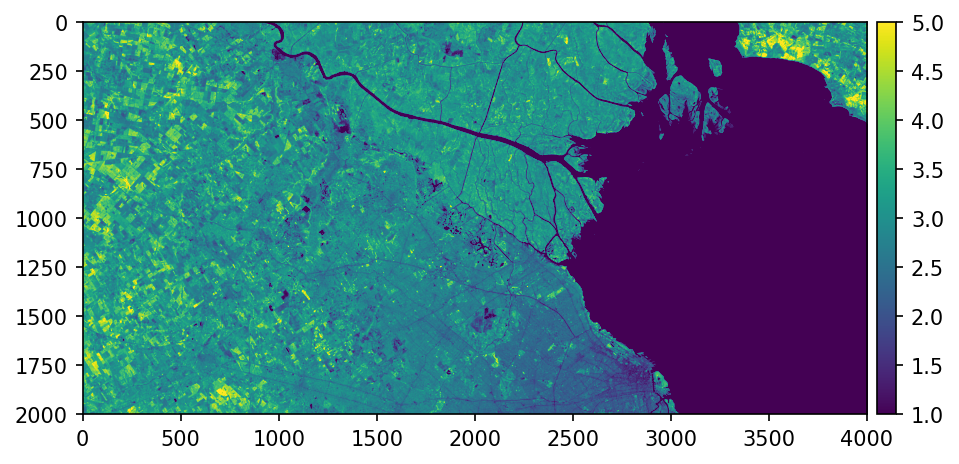

In [89]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bR,vmin=0, vmax=3)
add_colorbar(im)
plt.show()
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bNIR,vmin=1, vmax=5)
add_colorbar(im)
plt.show()

# Composiciones con colores verdaderos y falsos
También puedo componer diferentes bandas y obtener una imágen a color (RBG). No nos vamos a meter con los detalles de la ecualización de imagenes, solo daremos dos ejemplos.

* La primera imágen usa las bandas RBG para crear una imágen bastante realista

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2001, 4001, 3)


array([1.406, 1.036, 0.748])

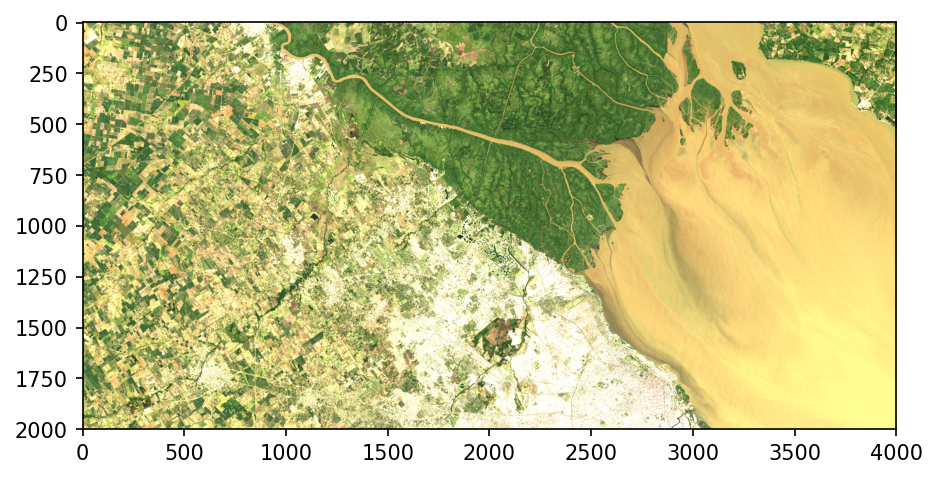

In [10]:
rgb = np.dstack((bR,bG,bB))
plt.figure(figsize=(7,7), dpi=150)
plt.imshow(rgb)
print(rgb.shape)
rgb[0,0]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


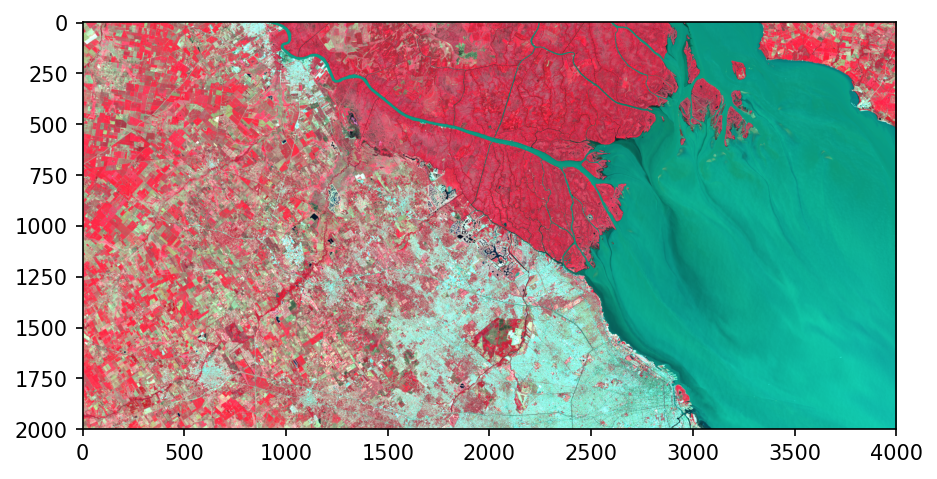

In [92]:
plt.figure(figsize=(7,7), dpi=150)
rgb = np.dstack((bNIR/4,bR/1.5,bG/1.5))
plt.imshow(rgb)

# El cómputo de atributos: caso NDVI (índice verde)


In [11]:
#calculo NDVI y trunco potenciales problemas
ndvi = (bNIR - bR) / (bNIR+bR)
ndvi[ndvi>1]=1
ndvi[ndvi<-1]=-1

/home/rgrimson/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


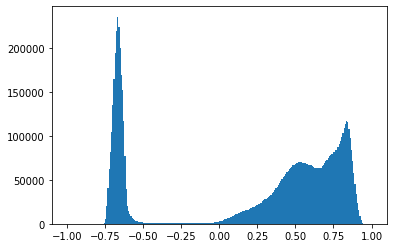

In [12]:
h=plt.hist(ndvi.flatten(),bins=250)

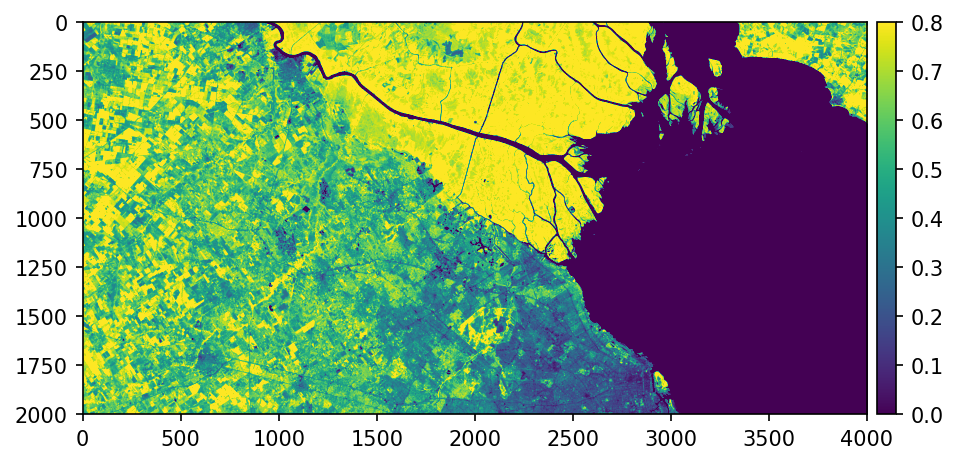

In [13]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(ndvi,vmin=0, vmax=0.8)
add_colorbar(im)
plt.show()
#plt.imshow(ndvi,vmin=-1,vmax=0)

# Recortes (clips)

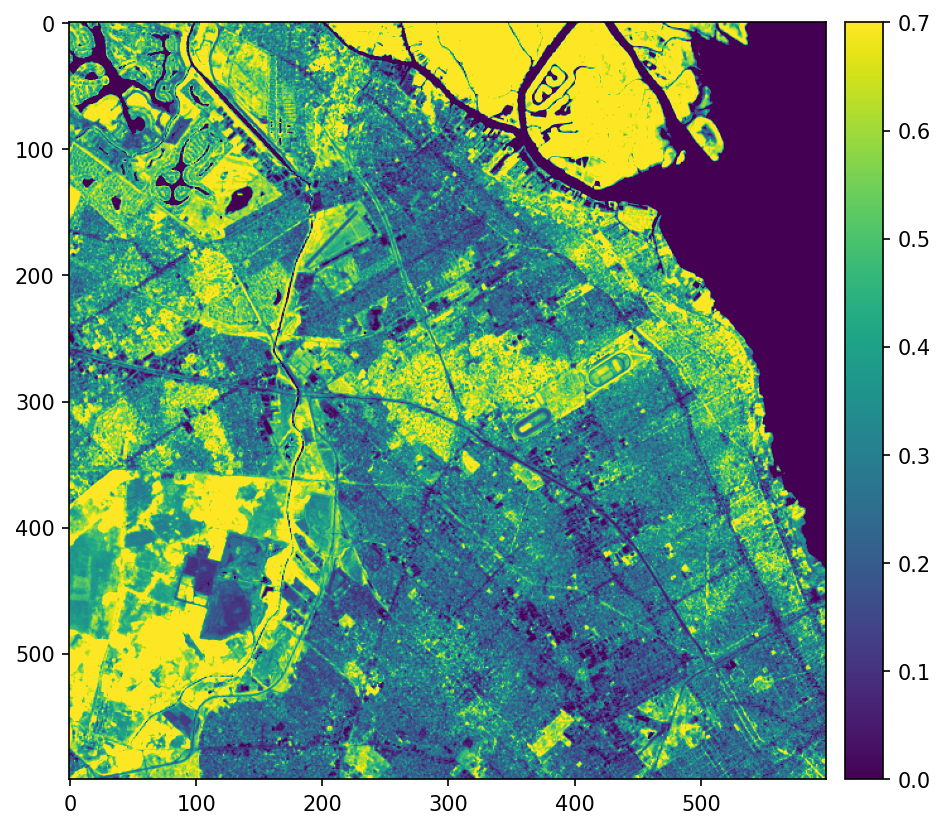

In [14]:
#elijo un clip pequeño para hacer las pruebas
sy = 1100
sx = 2000
dx = 600
dy = 600
clip = ndvi[sy:sy+dy, sx:sx+dx]
plt.figure(figsize=(7,7), dpi=150)
im =plt.imshow(clip,vmin=0,vmax=.7)
add_colorbar(im)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


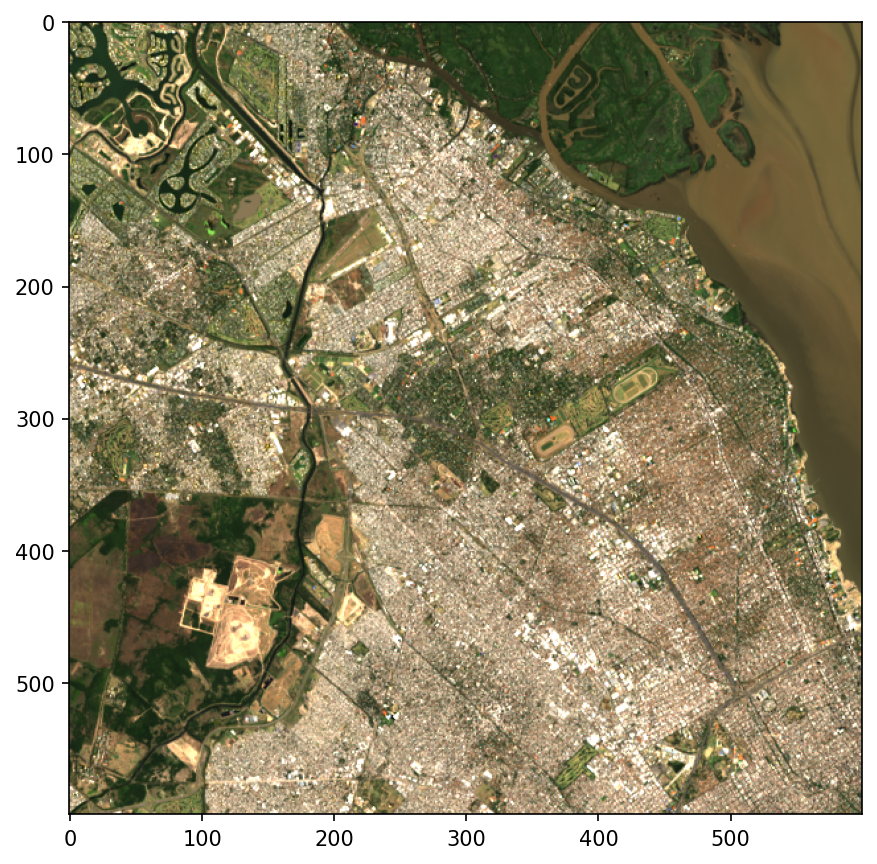

In [110]:
rgb = np.dstack((bR[sy:sy+dy, sx:sx+dx]/2,bG[sy:sy+dy, sx:sx+dx]/2,bB[sy:sy+dy, sx:sx+dx]/2))
plt.figure(figsize=(7,7), dpi=150)
plt.imshow(rgb)

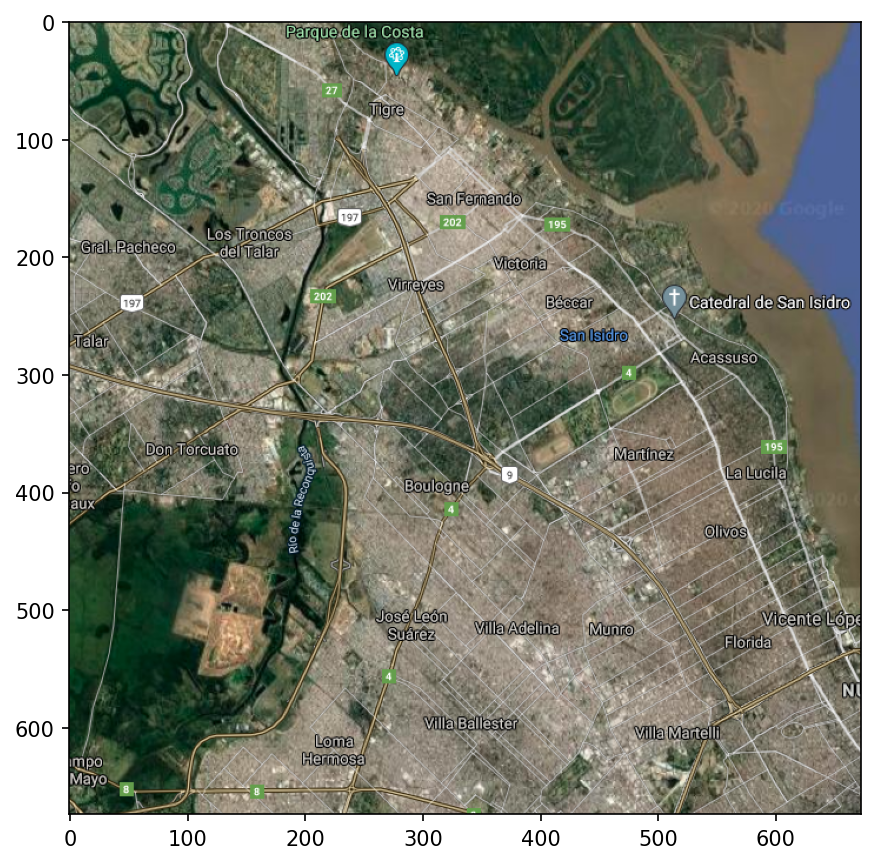

In [98]:
#%%
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img_google = mpimg.imread("Data/img_google.png")
plt.figure(figsize=(7,7), dpi=150)
plt.imshow(img_google)
plt.show()

# Técnicas de Clustering. El caso de kmeans

Usamos un algoritmo de clustering para obtener clusters de pixels similares a partir de los datos de NDVI calculados antes.

In [35]:
#%%
#importo el clasificador y defino una instancia para clasificar con dos etiquetas
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=15)

#le saco la estructura bidimensional a la matriz NDVI y la llamo datos
datos = clip.reshape(-1,1)

In [36]:
datos.shape

(360000, 1)

In [37]:
#entreno o ajusto el el clasificador con los datos (demora!)
kmeans.fit(datos) #ajusta el modelo
#usa el modelo ajustado para poner etiquetas
etiquetas = kmeans.predict(datos) 

Visulicemos los resultados

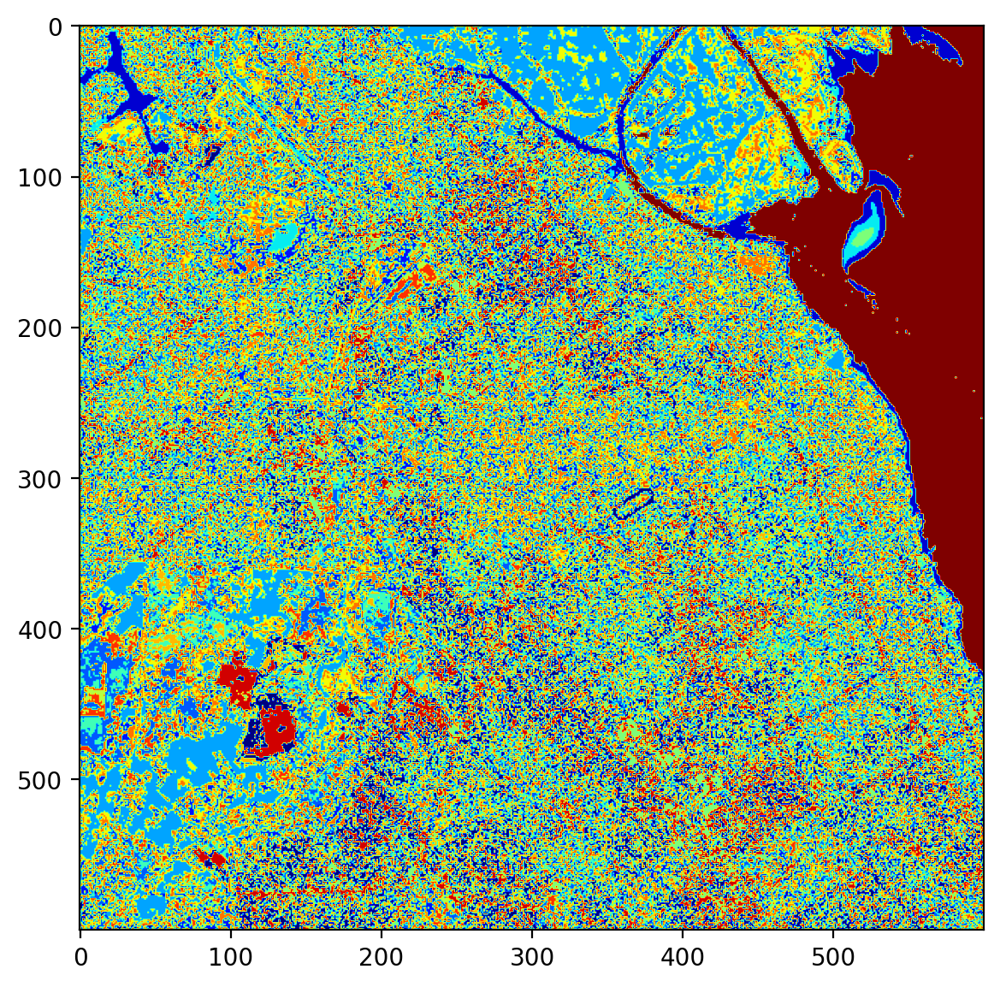

In [38]:
#%%
#visualizo los resultado,s recuperando la estructura de matriz
plt.figure(figsize=(7,7), dpi=200)
im = plt.imshow(etiquetas.reshape(clip.shape),cmap='jet')
#add_colorbar(im)
plt.show()

#%%